In [22]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

INPUT CHANNEL TEST

In [23]:
################### Split train - test ###################

patch_image_dir = "/Users/rfalcao/Documents/FYP/FullSet/cusp_images"  # Change to actual path
patch_mask_dir = "/Users/rfalcao/Documents/FYP/FullSet/masks"

import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split

IMG_SIZE = 224  # Input size for U-Net

# Get all image filenames
image_filenames = sorted(os.listdir(patch_image_dir))  # Sort for consistency
mask_filenames = set(os.listdir(patch_mask_dir))  # Convert to set for fast lookup
print(len(image_filenames))
print(len(mask_filenames))

# Split filenames into train (80%) and unseen test set (20%)
train_filenames, test_filenames = train_test_split(image_filenames, test_size=0.07, random_state=42)

print(f"Training Set: {len(train_filenames)} images")
print(f"Unseen Test Set: {len(test_filenames)} images")
NUM_CLASSES = 1
IMG_SIZE = 224  # Input size for U-Net
from metrics import log_dice_loss , dice_coef, iou

283
284
Training Set: 263 images
Unseen Test Set: 20 images


In [24]:
# Data augmentation settings
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

# CLAHE helper
def compute_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_uint8 = (img * 255).astype(np.uint8)
    clahe_img = clahe.apply(img_uint8)
    return clahe_img.astype(np.float32) / 255.0

# Sobel helper with large kernel
def compute_sobel_channel(img):
    dx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=7)
    dy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=7)
    magnitude = np.sqrt(dx**2 + dy**2)
    magnitude = magnitude / (magnitude.max() + 1e-8)
    return magnitude.astype(np.float32)

# Main preprocessing + augmentation
def split_and_augment_quadrants(filenames, image_dir, mask_dir, num_augments_per_image=2):
    images, masks = [], []

    for filename in filenames:
        img_path = os.path.join(image_dir, filename)
        mask_filename = filename.replace("image", "mask")
        mask_path = os.path.join(mask_dir, mask_filename) if mask_filename in mask_filenames else None

        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"Skipping {filename} (missing image)")
            continue

        img = img.astype(np.float32) / 255.0
        clahe_img = compute_clahe(img)
        sobel_img = compute_sobel_channel(img)

        # Stack 3 channels: grayscale, CLAHE, Sobel
        combined_input = np.stack([img, clahe_img, sobel_img], axis=-1)

        # Load mask
        if mask_path and os.path.exists(mask_path):
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = mask.astype(np.float32) / 255.0
            mask = np.expand_dims(mask, axis=-1)
        else:
            print(f"{filename} (missing mask)")
            mask = np.zeros((img.shape[0], img.shape[1], 1), dtype=np.float32)

        h, w = img.shape[:2]
        mid_y, mid_x = h // 2, w // 2

        quadrants = [
            (0, mid_y, 0, mid_x),      # top-left
            (0, mid_y, mid_x, w),      # top-right
            (mid_y, h, 0, mid_x),      # bottom-left
            (mid_y, h, mid_x, w),      # bottom-right
            (0, h, 0, w)               # full image
        ]

        for (y0, y1, x0, x1) in quadrants:
            q_img = combined_input[y0:y1, x0:x1, :]
            q_mask = mask[y0:y1, x0:x1, :]
            q_img_resized = cv2.resize(q_img, (IMG_SIZE, IMG_SIZE))
            q_mask_resized = cv2.resize(q_mask, (IMG_SIZE, IMG_SIZE))
            images.append(q_img_resized)
            masks.append(q_mask_resized)

            for _ in range(num_augments_per_image):
                seed = np.random.randint(10000)
                aug_img = datagen.random_transform(q_img, seed=seed)
                aug_mask = datagen.random_transform(q_mask, seed=seed)
                aug_img = cv2.resize(aug_img, (IMG_SIZE, IMG_SIZE))
                aug_mask = cv2.resize(aug_mask, (IMG_SIZE, IMG_SIZE))

                if np.sum(aug_mask) > 0.01:
                    images.append(aug_img)
                    masks.append(aug_mask)

    return np.array(images), np.array(masks)

# Load and augment patches
augmented_x_train, augmented_y_train = split_and_augment_quadrants(
    train_filenames, patch_image_dir, patch_mask_dir, num_augments_per_image=3
)


Skipping .DS_Store (missing image)


In [4]:
def unet_model(input_size=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = Input(input_size)

    # Contracting path (encoder)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    pool3 = MaxPooling2D((2, 2))(conv3)  # New down-sampling layer ✅

    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)  # New layer ✅
    pool4 = MaxPooling2D((2, 2))(conv4)  # New down-sampling layer ✅

    # Bottleneck
    conv5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(pool4)  # Deepest layer ✅

    # Expansive path (decoder)
    up1 = UpSampling2D((2, 2))(conv5)
    concat1 = Concatenate()([up1, conv4])
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(concat1)  # New layer ✅

    up2 = UpSampling2D((2, 2))(conv6)
    concat2 = Concatenate()([up2, conv3])
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat2)

    up3 = UpSampling2D((2, 2))(conv7)
    concat3 = Concatenate()([up3, conv2])
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat3)

    up4 = UpSampling2D((2, 2))(conv8)
    concat4 = Concatenate()([up4, conv1])
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat4)

    # Final segmentation map
    output = Conv2D(NUM_CLASSES, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs, output)
    model.compile(optimizer=Adam(learning_rate=1e-6), loss='binary_crossentropy', metrics=['binary_accuracy', dice_coef, iou])
    return model

# Create and train model
model = unet_model()
model.summary()


2025-04-14 20:31:45.502280: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2025-04-14 20:31:45.502856: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2025-04-14 20:31:45.502864: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2025-04-14 20:31:45.502882: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-04-14 20:31:45.502897: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 224, 224,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 112, 112,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 56, 56,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 56, 56,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 28, 28,    │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 28, 28,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 14, 14,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 14, 14,    │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 28, 28,    │          0 │ conv2d_4[0][0]    │
│ (UpSampling2D)      │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 28, 28,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 1536)             │            │ conv2d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 28, 28,    │  7,078,400 │ concatenate[0][0] │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 56, 56,    │          0 │ conv2d_5[0][0]    │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 56, 56,    │          0 │ up_sampling2d_1[… │
│ (Concatenate)       │ 768)              │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 56, 56,    │  1,769,728 │ concatenate_1[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 112, 112,  │          0 │ conv2d_6[0][0]  

 Total params: 15,671,937 (59.78 MB)

 Trainable params: 15,671,937 (59.78 MB)

 Non-trainable params: 0 (0.00 B)

In [25]:
################### Check for blank masks ###################

print("Checking dataset for blank masks...")
num_blank_masks = np.sum(np.all(augmented_y_train == 0, axis=(1,2)))  # Count fully blank masks
print(f"⚠️ Found {num_blank_masks} blank masks out of {len(augmented_y_train)} total.")

if num_blank_masks > 0:
    print(f"❌ Your dataset contains {num_blank_masks} fully blank masks! Consider removing or handling them.")


Checking dataset for blank masks...
⚠️ Found 7 blank masks out of 5137 total.
❌ Your dataset contains 7 fully blank masks! Consider removing or handling them.


In [26]:
from tensorflow.keras.models import load_model
pretrained_model_path = "/Users/rfalcao/FYP/CLAHE_sobel.h5" 
# Load the model with custom metrics
model = load_model(pretrained_model_path, custom_objects={'dice_coef': dice_coef, 'iou': iou})

# Freeze early encoder layers to retain cusp knowledge


# Compile with a lower learning rate for gradual fine-tuning
model.compile(optimizer=Adam(learning_rate=1e-6), loss='binary_crossentropy', metrics=['binary_accuracy', dice_coef, iou])



In [ ]:
################### Train model ###################

from tensorflow.keras.callbacks import EarlyStopping

# mixed_precision.set_global_policy('mixed_float16')
# ✅ Use Early Stopping for efficient training
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
with tf.device('/CPU:0'):
    
    # ✅ Train the model
    history = model.fit(
        augmented_x_train, augmented_y_train,
        epochs=10,  
        batch_size=4,  
        validation_split=0.2,
        callbacks=[early_stopping],
        verbose=1
    )


Epoch 1/10
1028/1028 ━━━━━━━━━━━━━━━━━━━━ 3276s 3s/step - binary_accuracy: 0.8185 - dice_coef: 0.5838 - iou: 0.5186 - loss: 0.3461 - val_binary_accuracy: 0.8096 - val_dice_coef: 0.5320 - val_iou: 0.4769 - val_loss: 0.3782
Epoch 2/10
 633/1028 ━━━━━━━━━━━━━━━━━━━━ 19:51 3s/step - binary_accuracy: 0.8144 - dice_coef: 0.5875 - iou: 0.5211 - loss: 0.3534

In [28]:
model.save('CLAHE_sobel.h5')

In [8]:
with tf.device('/CPU:0'):
    
    # ✅ Train the model
    history = model.fit(
        augmented_x_train, augmented_y_train,
        epochs=5,  
        batch_size=4,  
        validation_split=0.2,
        callbacks=[early_stopping],
        verbose=1
    )

Epoch 1/5
1029/1029 ━━━━━━━━━━━━━━━━━━━━ 2925s 3s/step - binary_accuracy: 0.7991 - dice_coef: 0.5374 - iou: 0.4691 - loss: 0.3772 - val_binary_accuracy: 0.7873 - val_dice_coef: 0.4845 - val_iou: 0.4115 - val_loss: 0.4084
Epoch 2/5
1029/1029 ━━━━━━━━━━━━━━━━━━━━ 2944s 3s/step - binary_accuracy: 0.8032 - dice_coef: 0.5405 - iou: 0.4732 - loss: 0.3719 - val_binary_accuracy: 0.7915 - val_dice_coef: 0.4787 - val_iou: 0.3994 - val_loss: 0.4048
Epoch 3/5
1029/1029 ━━━━━━━━━━━━━━━━━━━━ 3048s 3s/step - binary_accuracy: 0.7997 - dice_coef: 0.5494 - iou: 0.4799 - loss: 0.3751 - val_binary_accuracy: 0.7924 - val_dice_coef: 0.4924 - val_iou: 0.4214 - val_loss: 0.4035
Epoch 4/5
1029/1029 ━━━━━━━━━━━━━━━━━━━━ 3142s 3s/step - binary_accuracy: 0.8034 - dice_coef: 0.5588 - iou: 0.4922 - loss: 0.3690 - val_binary_accuracy: 0.7946 - val_dice_coef: 0.4904 - val_iou: 0.4163 - val_loss: 0.3993
Epoch 5/5
1029/1029 ━━━━━━━━━━━━━━━━━━━━ 3098s 3s/step - binary_accuracy: 0.8051 - dice_coef: 0.5492 - iou: 0.4777 -

In [15]:
def load_test_images(filenames, image_dir, mask_dir):
    images, masks = [], []

    for filename in filenames:
        img_path = os.path.join(image_dir, filename)
        mask_filename = filename.replace("image", "mask")
        mask_path = os.path.join(mask_dir, mask_filename) if mask_filename in mask_filenames else None

        # Load grayscale image
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"Skipping {filename} (missing image)")
            continue

        # Resize and normalize
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE)).astype(np.float32) / 255.0

        # Compute CLAHE
        clahe = compute_clahe(img)
        sobel = compute_sobel_channel(img)

        # Stack 3 channels: grayscale, CLAHE, Sobel
        combined_input = np.stack([img, clahe, sobel], axis=-1)
        

        # Load mask
        if mask_path and os.path.exists(mask_path):
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE)).astype(np.float32) / 255.0
            mask = np.expand_dims(mask, axis=-1)
        else:
            mask = np.zeros((IMG_SIZE, IMG_SIZE, 1), dtype=np.float32)

        images.append(combined_input)
        masks.append(mask)

    return np.array(images), np.array(masks)


# Load test images (no augmentation)
X_test, y_test = load_test_images(test_filenames, patch_image_dir, patch_mask_dir)

print(f"Final Test Set Size: {len(X_test)} images")

Final Test Set Size: 20 images


In [16]:
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score




def save_plot(image, true_mask, predicted_mask, save_dir, img_index):
    """Save the plot with original image, ground truth mask, and predicted mask."""
    os.makedirs(save_dir, exist_ok=True)  # Ensure the folder exists

    # Normalize predicted mask to [0,1] for visualization
    

    # Create subplot
    plt.figure(figsize=(18, 6))

    # 🔹 Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(image[..., 0], cmap='gray')
    plt.title("Original Grayscale Image")
    plt.axis("off")

    # 🔹 Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap='gray')
    plt.title("Actual Mask (Ground Truth)")
    plt.axis("off")

    # 🔹 Predicted Mask with Probability Legend
    plt.subplot(1, 3, 3)
    mask_plot = plt.imshow(predicted_mask, cmap='jet')
    plt.colorbar(mask_plot, fraction=0.046, pad=0.04)  # ✅ Add colorbar legend
    plt.title("Predicted Mask (Probability)")
    plt.axis("off")

    # Save the figure
    save_path = os.path.join(save_dir, f"prediction_{img_index}.png")
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    plt.close()  # Close the plot to free memory

# ✅ Loop over test images
save_directory = "/Users/rfalcao/Documents/FYP/ManualSegmentationAnns/plots/SobelClahe"  # 🔹 Change this to your desired save folder

for i in range(len(X_test)):

    img = X_test[i]              # shape (224, 224, 2)
    true_mask = y_test[i].squeeze()
    predicted_mask = model.predict(np.expand_dims(img, axis=0))[0, :, :, 0]
    # Save the plot
    save_plot(img, true_mask, predicted_mask, save_directory, i)

2025-04-15 13:54:50.366108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


In [33]:
history = model.fit(
    augmented_x_train, augmented_y_train,
    epochs=5,  
    batch_size=4,  
    validation_split=0.2,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/5


/Users/rfalcao/anaconda3/envs/tf-m2/lib/python3.10/site-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


528/528 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - val_binary_accuracy: 0.8254 - val_dice_coef: 0.4472 - val_iou: 0.3300 - val_loss: 0.3152
Epoch 2/5
528/528 ━━━━━━━━━━━━━━━━━━━━ 2326s 4s/step - binary_accuracy: 0.8412 - dice_coef: 0.4894 - iou: 0.3791 - loss: 0.2807 - val_binary_accuracy: 0.8238 - val_dice_coef: 0.4410 - val_iou: 0.3162 - val_loss: 0.3158
Epoch 3/5
528/528 ━━━━━━━━━━━━━━━━━━━━ 2330s 4s/step - binary_accuracy: 0.8387 - dice_coef: 0.4942 - iou: 0.3843 - loss: 0.2833 - val_binary_accuracy: 0.8248 - val_dice_coef: 0.4464 - val_iou: 0.3220 - val_loss: 0.3140
Epoch 4/5
528/528 ━━━━━━━━━━━━━━━━━━━━ 2350s 4s/step - binary_accuracy: 0.8439 - dice_coef: 0.5085 - iou: 0.4041 - loss: 0.2758 - val_binary_accuracy: 0.8253 - val_dice_coef: 0.4444 - val_iou: 0.3156 - val_loss: 0.3139
Epoch 5/5
528/528 ━━━━━━━━━━━━━━━━━━━━ 2258s 4s/step - binary_accuracy: 0.8452 - dice_coef: 0.5037 - iou: 0.4009 - loss: 0.2728 - val_binary_accuracy: 0.8238 - val_dice_coef: 0.4403 - val_iou: 0.3039 - val_los

In [34]:
model.save('CLAHE_big_ref.h5')

In [17]:
model_a = load_model('BC50Tuned.h5')
model_b = load_model('BC50Tuned2.h5')
model_c = load_model('CLAHE_big.h5')
model_d = load_model('CLAHE_big_ref.h5')


In [19]:
import matplotlib.pyplot as plt
import os

def compare_models(img_index, X_single, X_clahe, y_test, model_a, model_b, model_c, model_d, save_dir=None):
    # Select sample
    img_single = X_single[img_index]
    img_clahe = X_clahe[img_index]
    true_mask = y_test[img_index].squeeze()

    # Predictions
    pred_a = model_a.predict(np.expand_dims(img_single, axis=0))[0, ..., 0]
    pred_b = model_b.predict(np.expand_dims(img_single, axis=0))[0, ..., 0]
    pred_c = model_c.predict(np.expand_dims(img_clahe, axis=0))[0, ..., 0]
    pred_d = model_d.predict(np.expand_dims(img_clahe, axis=0))[0, ..., 0]

    # Plotting
    plt.figure(figsize=(20, 10))

    # Original grayscale image
    plt.subplot(2, 3, 1)
    plt.imshow(img_single[..., 0], cmap='gray')
    plt.title("Original Grayscale Image")
    plt.axis("off")

    # Ground truth
    plt.subplot(2, 3, 2)
    plt.imshow(true_mask, cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis("off")

    # Predictions
    titles = ["Model A (1-channel)", "Model B (1-channel)", "Model C (CLAHE)", "Model D (CLAHE)"]
    preds = [pred_a, pred_b, pred_c, pred_d]

    for i, (title, pred) in enumerate(zip(titles, preds), start=3):
        plt.subplot(2, 3, i)
        im = plt.imshow(pred, cmap='jet')
        plt.colorbar(im, fraction=0.046, pad=0.04)
        plt.title(title)
        plt.axis("off")

    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        path = os.path.join(save_dir, f"compare_{img_index}.png")
        plt.savefig(path, bbox_inches='tight', dpi=300)
        print(f"✅ Saved: {path}")

    plt.show()
    plt.close()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_0.png


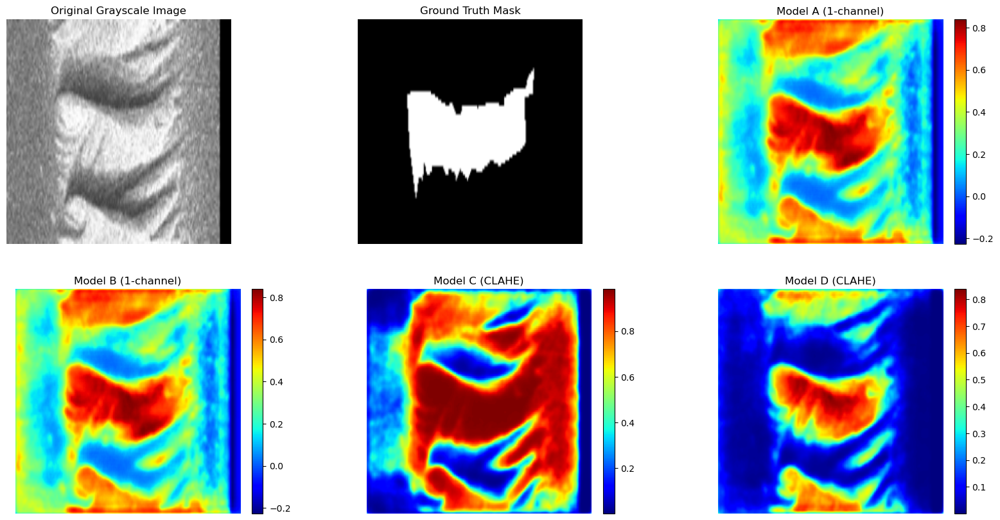

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_1.png


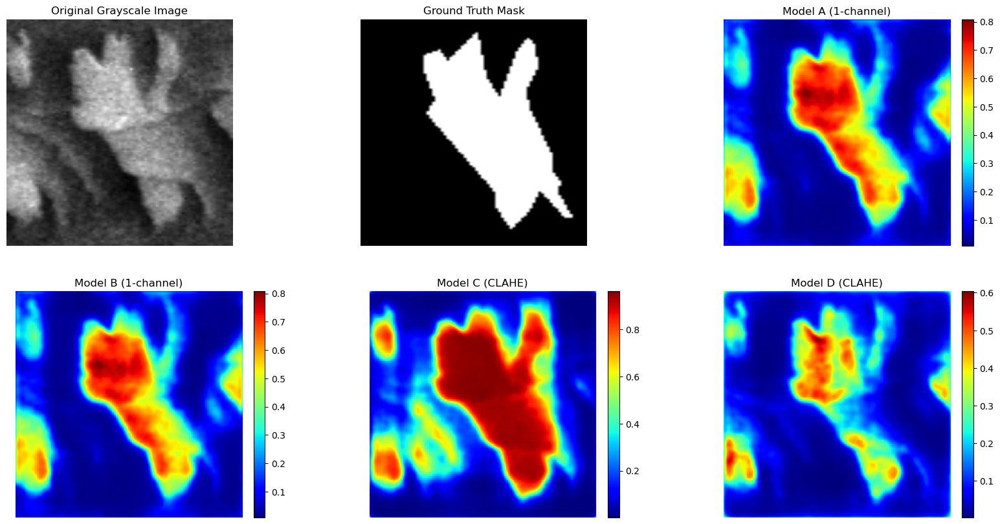

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_2.png


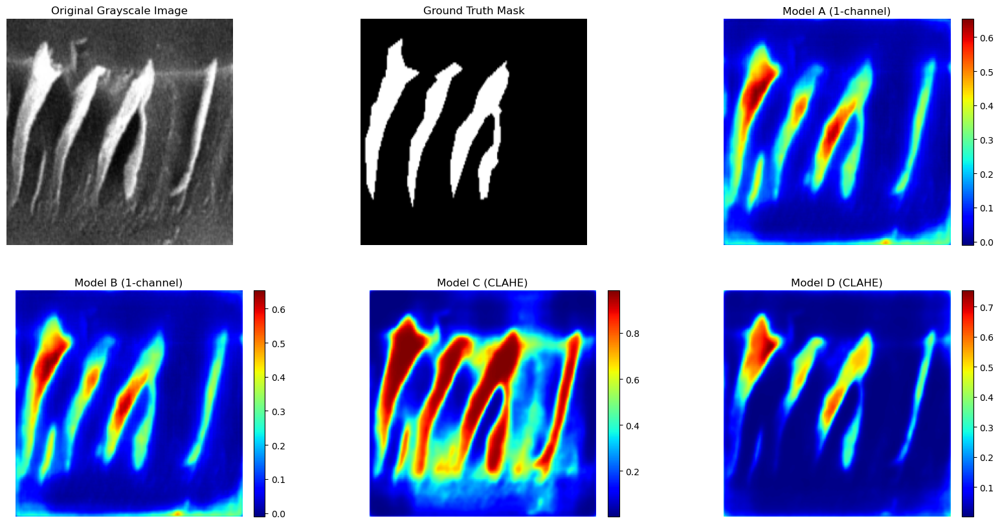

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_3.png


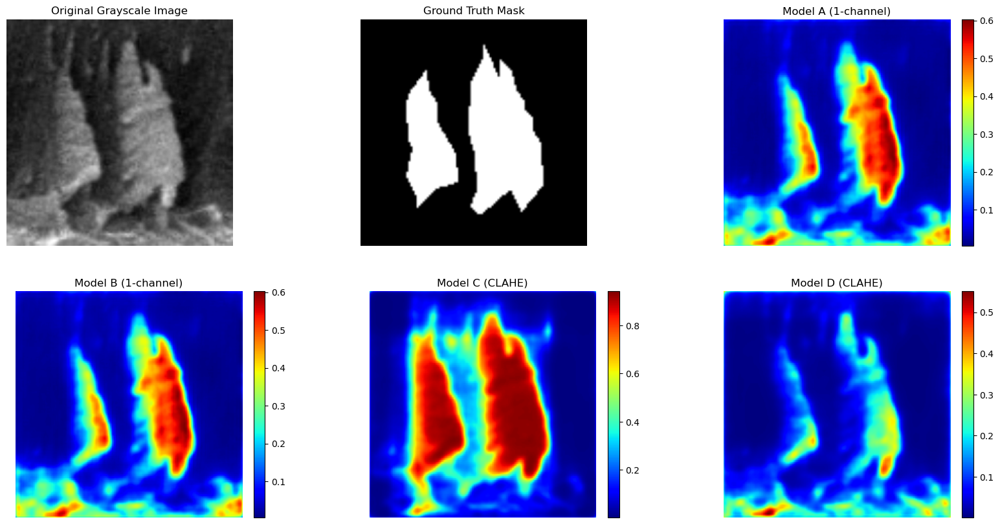

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_4.png


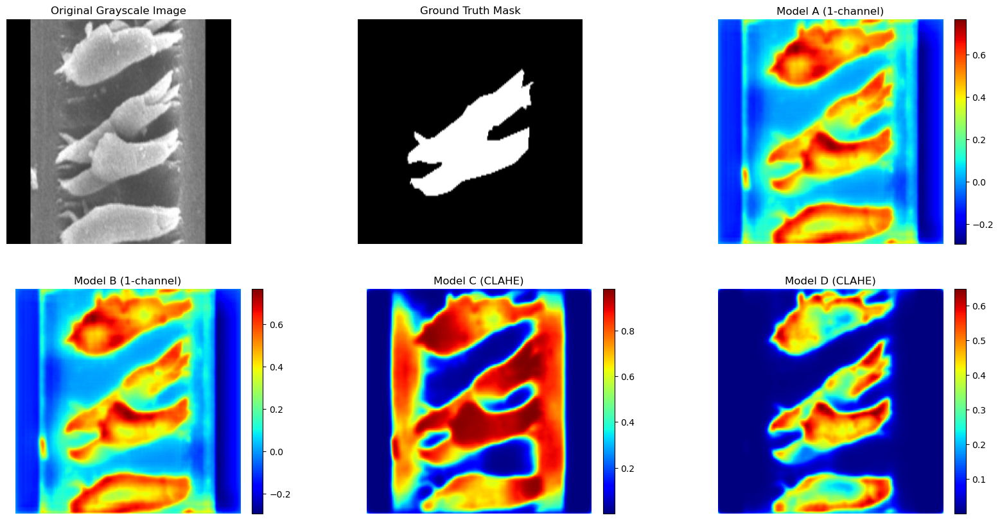

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_5.png


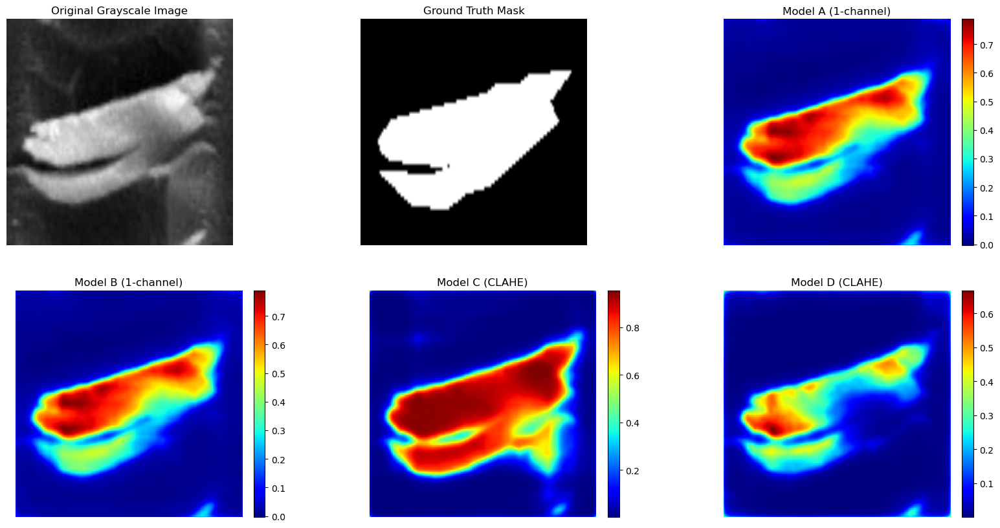

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_6.png


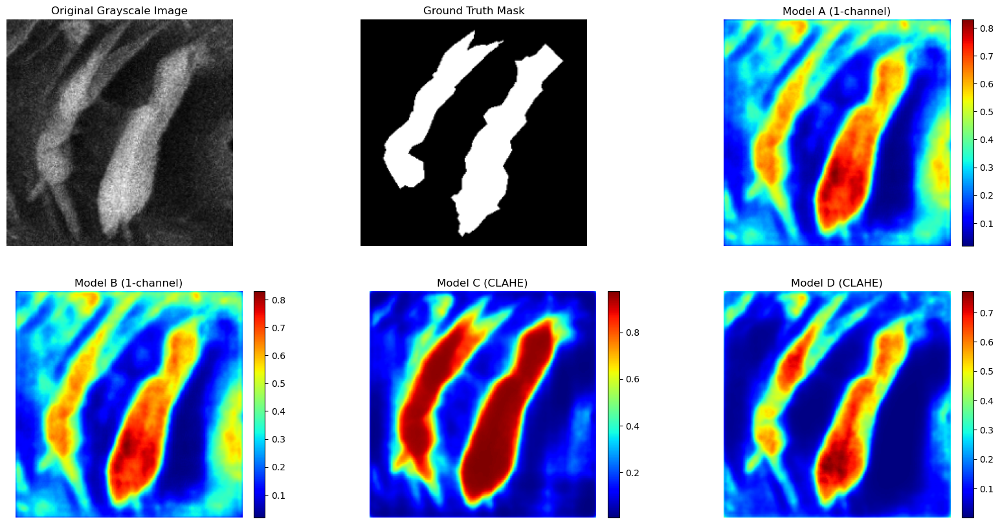

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_7.png


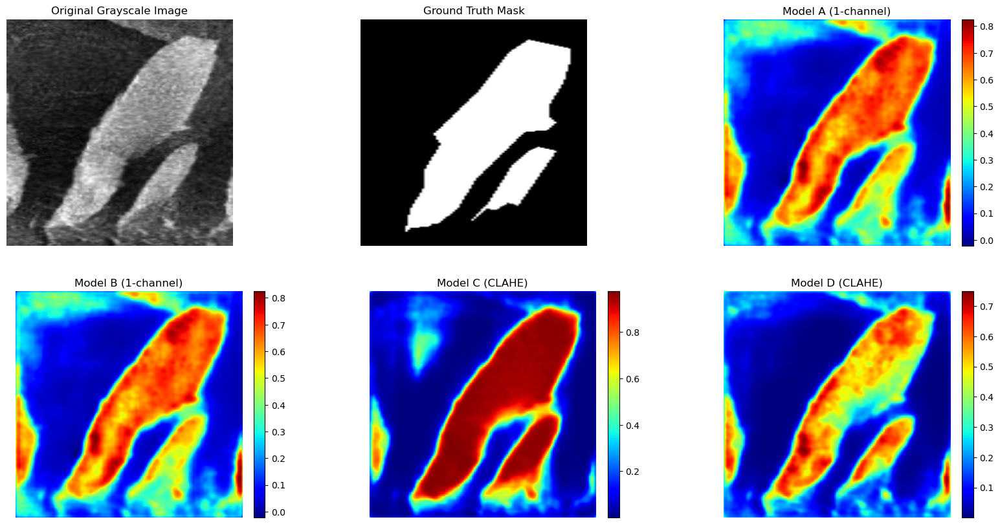

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_8.png


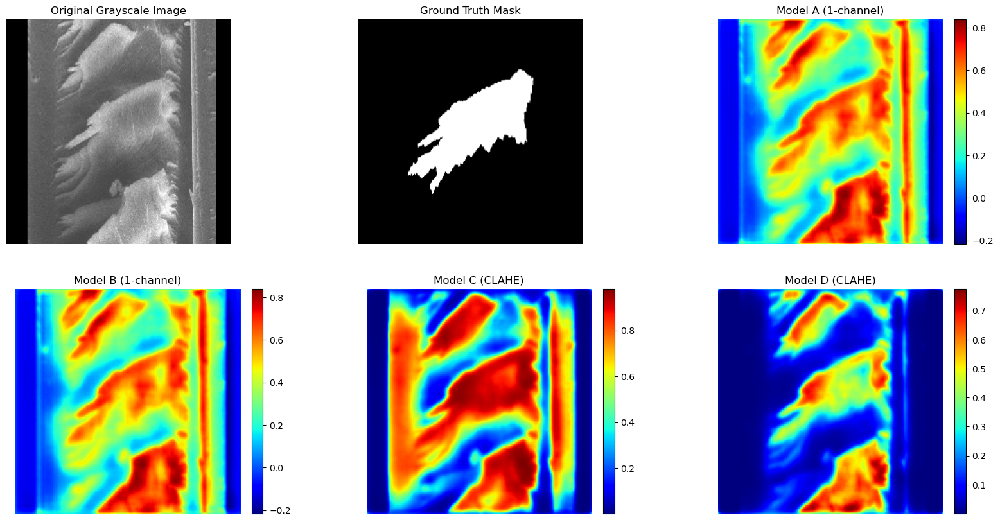

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_9.png


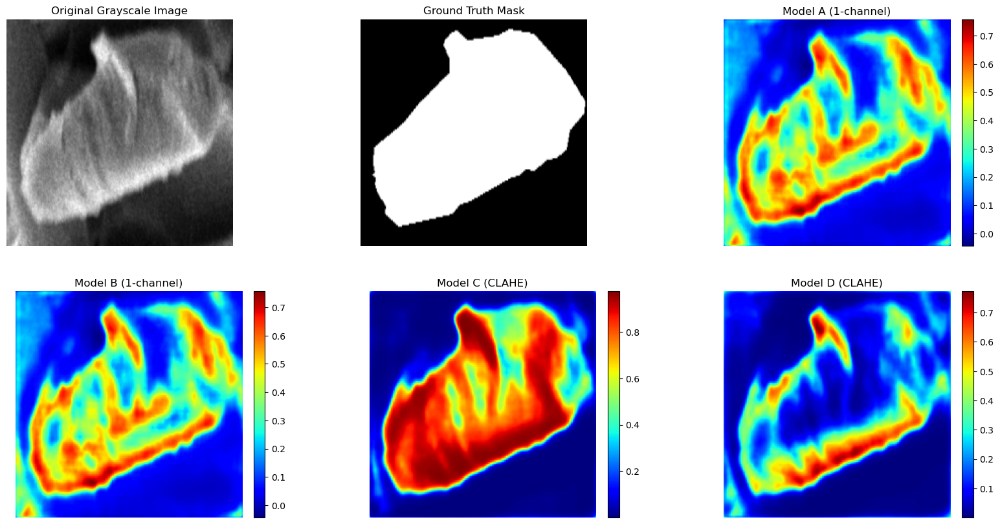

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_10.png


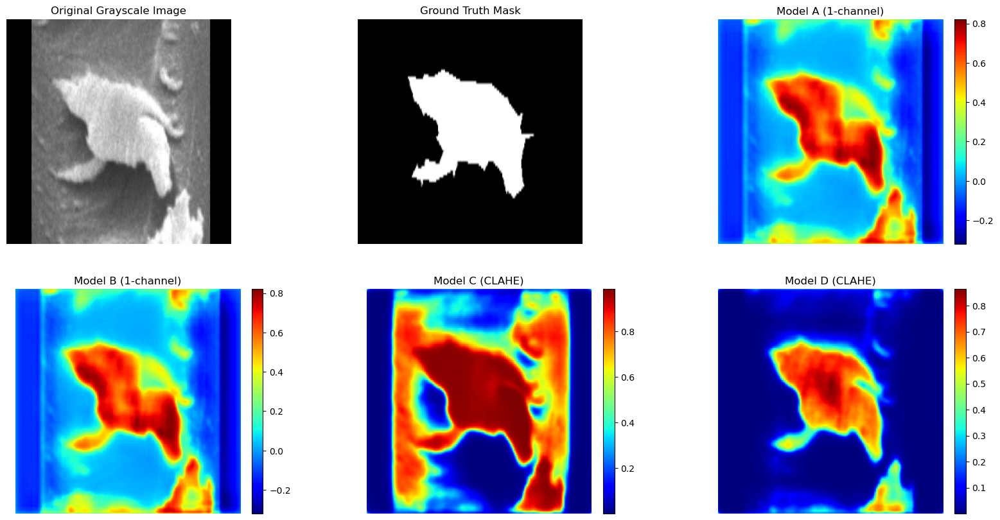

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_11.png


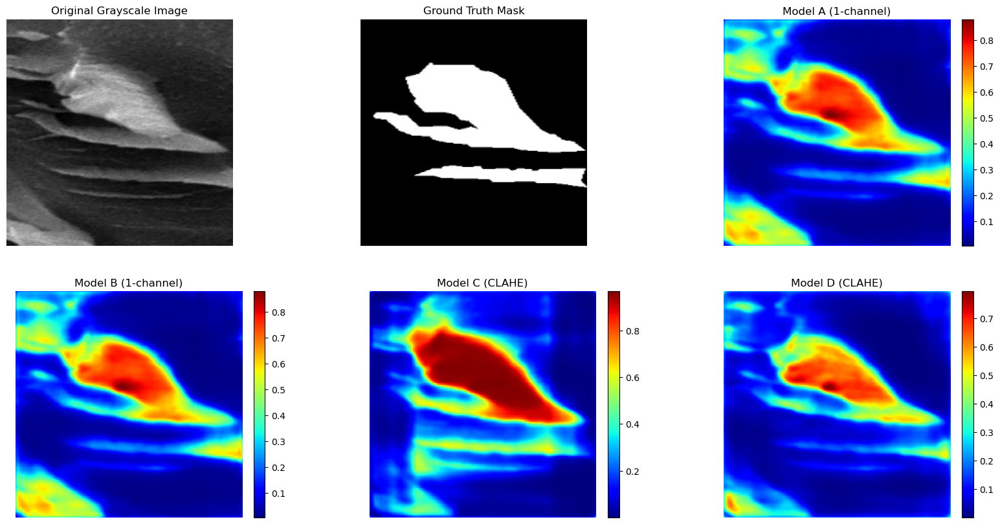

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_12.png


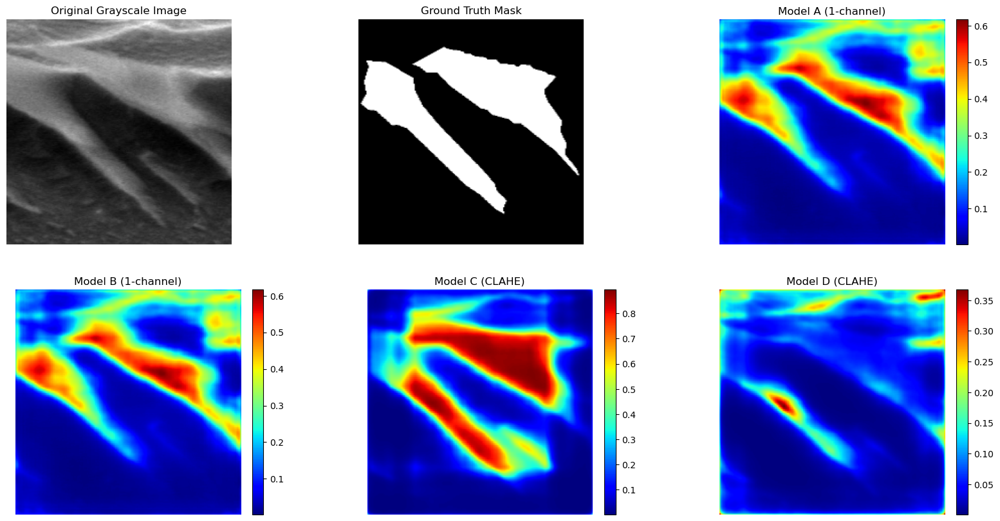

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_13.png


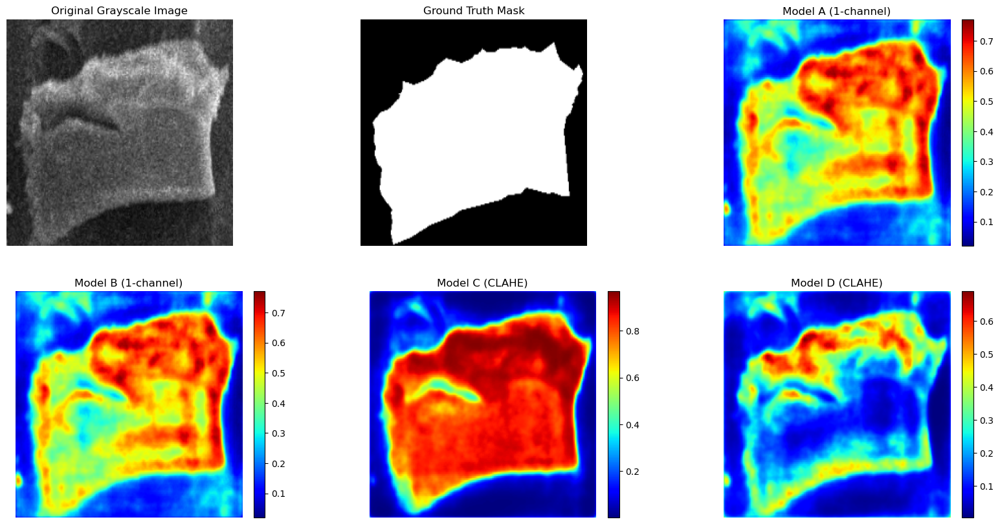

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_14.png


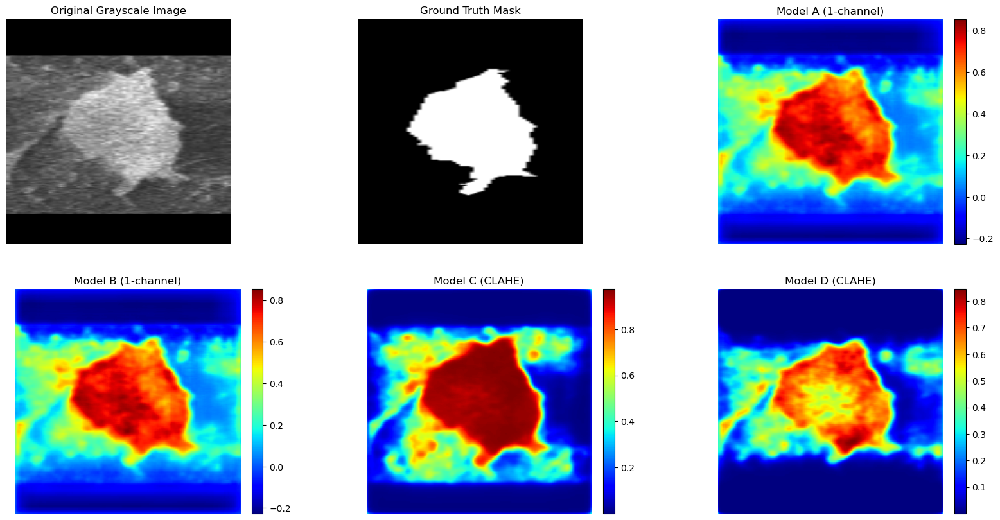

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_15.png


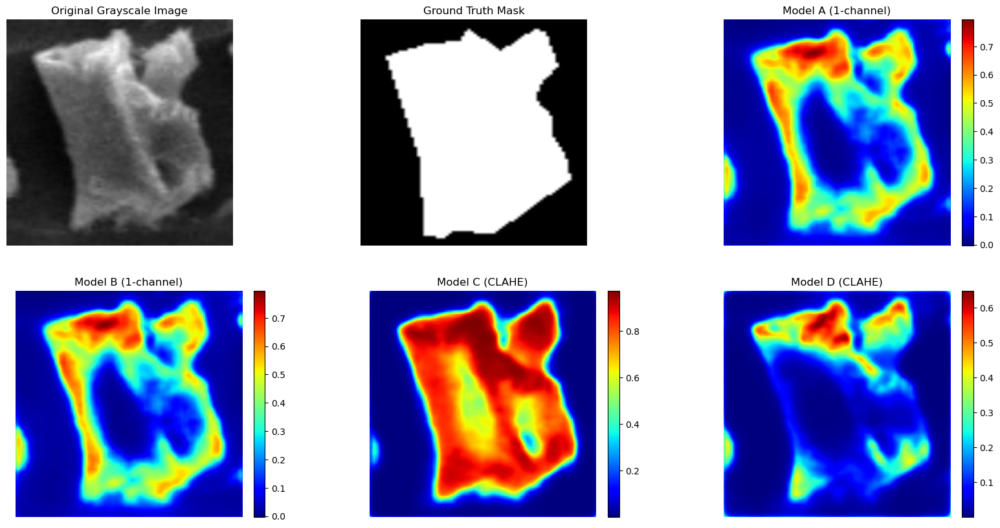

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_16.png


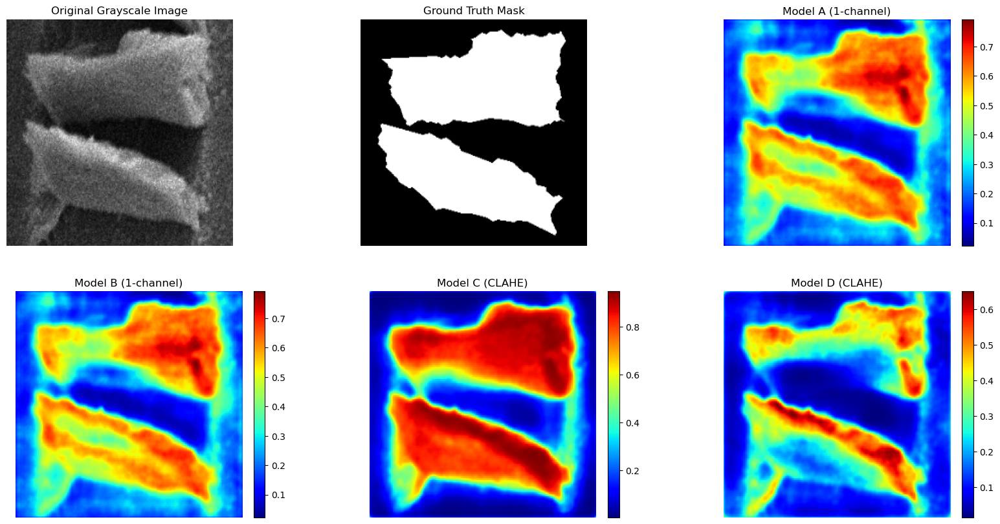

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_17.png


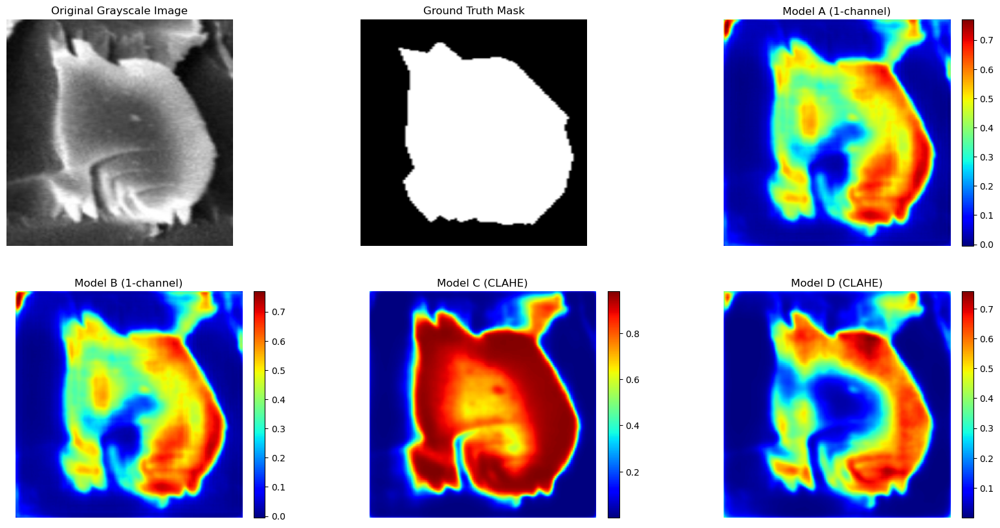

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_18.png


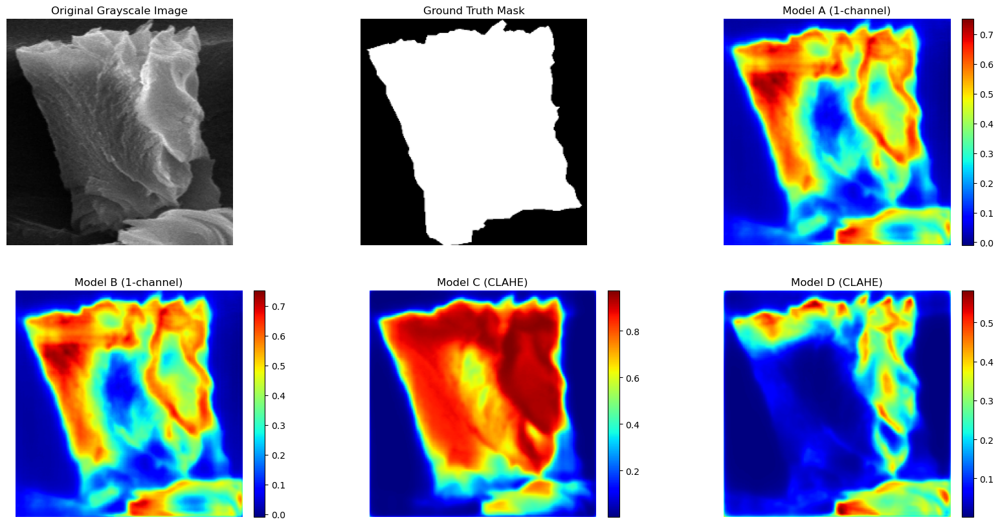

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
✅ Saved: /Users/rfalcao/Documents/FYP/ModelComparisons/compare_19.png


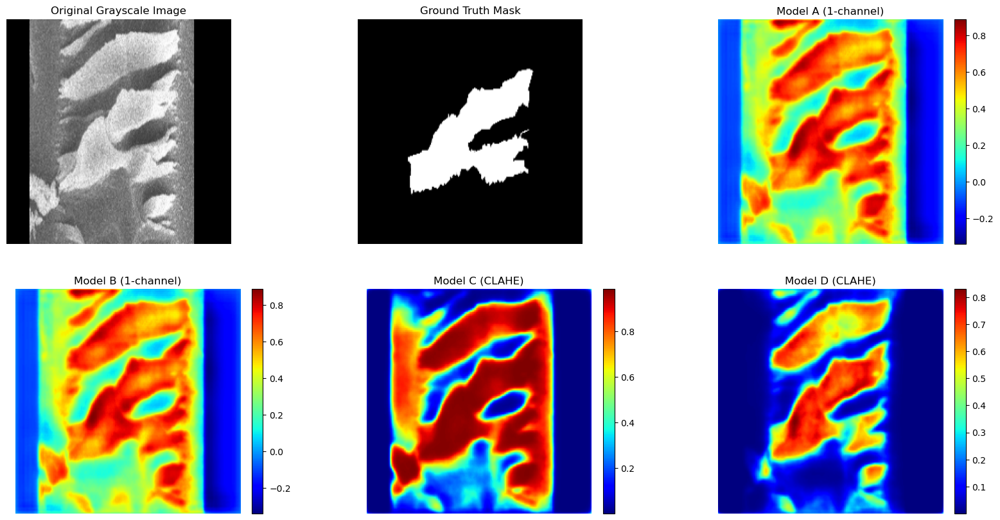

In [21]:
X_test_single = X_test[..., 0:1]  # Shape: (N, 224, 224, 1)

# 2-channel input remains unchanged
X_test_clahe = X_test[...,0:2]
for i in range(X_test_clahe.shape[0]):
    
# Now call comparison plot
    compare_models(
        img_index=i,
        X_single=X_test_single,
        X_clahe=X_test_clahe,
        y_test=y_test,
        model_a=model_a,
        model_b=model_b,
        model_c=model_c,
        model_d=model_d,
        save_dir="/Users/rfalcao/Documents/FYP/ModelComparisons"
    )